In [1]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

In [39]:
pip install --upgrade ipykernel

/usr/local/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Looking in indexes: https://pypi.k.avito.ru/pypi/
     |████████████████████████████████| 153kB 44.5MB/s eta 0:00:01
     |████████████████████████████████| 3.1MB 58.0MB/s eta 0:00:01
     |████████████████████████████████| 286kB 66.3MB/s eta 0:00:01
     |████████████████████████████████| 788kB 75.2MB/s eta 0:00:01
  Found existing installation: ipython 7.19.0
    Uninstalling ipython-7.19.0:
      Successfully uninstalled ipython-7.19.0
  Found existing installation: ipykernel 5.3.4
    Uninstalling ipykernel-5.3.4:
      Successfully uninstalled ipykernel-5.3.4
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import torchvision

In [105]:
from heuristics.model.dataset import TorchDataset, get_pd_dataset, load_images
from heuristics.model.settings import IMAGES_DIR
from heuristics.model.classifier import RoomModel
from heuristics.model.trainer import TrainerUtils
from heuristics.model.utils import get_preprocessor

from torch.utils.data import DataLoader
from torch.optim import AdamW
from torch import nn
import torch
from tqdm import tqdm_notebook

import numpy as np
import os
from sklearn.metrics import classification_report
from transformers import get_linear_schedule_with_warmup

from sklearn.metrics import (
    ConfusionMatrixDisplay,
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
)
import matplotlib.pyplot as plt

from heuristics.model.trainer import predict_img_batch

from PIL import Image

from heuristics.model.metrics import Metrics

from heuristics.model.settings import ROOM_TYPES, VALID_ROOM_TYPES, CLASS_NAME_MAPPING

from heuristics.model.utils import plot_imgs_with_labels, plot_sample, load_images

import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)

In [97]:
# set your own paths
BASE_DIR_PATH = '/app/'
BASE_DATA_DIR = '/data/'

CSV_DATA_DIR = os.path.join(BASE_DIR_PATH, '/heuristics/data/')
TRAIN_IMGS_DATA_DIR = os.path.join(BASE_DATA_DIR, 'train_images')
TEST_IMGS_DATA_DIR = os.path.join(BASE_DATA_DIR, 'test_images')

TRAIN_DF_DIR = os.path.join(BASE_DIR_PATH, '/app/heuristics/data/AAA_dataset_course_ha_TOLOKA_dataset_new.csv')
TEST_DF_DIR = os.path.join(BASE_DIR_PATH, 'heuristics/data/AAA_dataset_course_ha_TRUE_TEST.csv')

In [31]:
%%time
# скачиваем картинки
load_images(train_df['image'], TRAIN_IMGS_DATA_DIR)
load_images(test_df['image'], TEST_IMGS_DATA_DIR)

CPU times: user 11.1 s, sys: 11.9 s, total: 23 s
Wall time: 13.2 s


In [83]:
# определим локальный путь до картинок
train_df['img_path'] = train_df['image'].map(
    lambda x: os.path.join(TRAIN_IMGS_DATA_DIR, os.path.split(x)[-1])
)
test_df['img_path'] = test_df['image'].map(
    lambda x: os.path.join(TEST_IMGS_DATA_DIR, os.path.split(x)[-1])
)

<AxesSubplot:ylabel='result'>

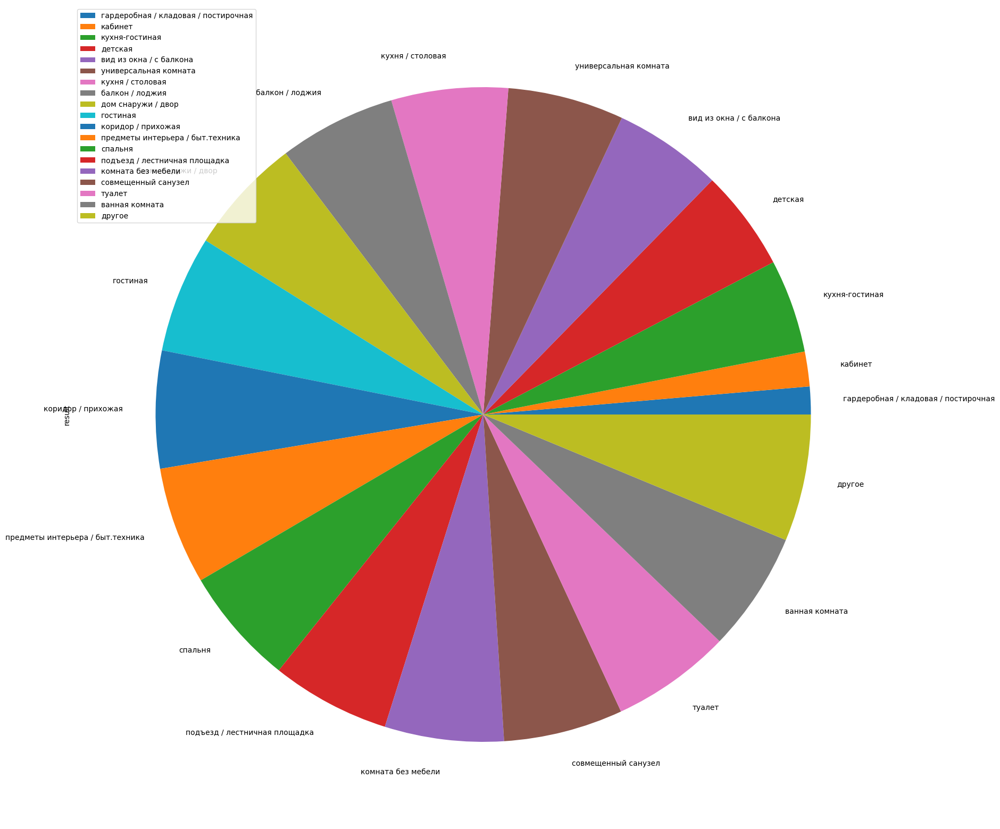

In [11]:
train_df['room_type'] = train_df['result'].map(CLASS_NAME_MAPPING)
train_df.groupby('room_type').count().sort_values('result').plot.pie(y='result', figsize=(20, 20))

In [12]:
# картинки из одного айтема не могут лежать в разных сетах

In [87]:
test_df[test_df['type'] == 'heuristics']['label'].value_counts()

гардеробная / кладовая / постирочная    202
кабинет                                 189
детская                                  65
другое                                   50
предметы интерьера / быт.техника         44
Name: label, dtype: int64

In [101]:
columns = [TorchDataset.img_path_column, TorchDataset.label_column, TorchDataset.image_id_column, 'label', 'ratio']
#print(columns)

# train_df = pd.read_csv('/app/data/TOLOKA_dataset_HA_1.csv')#[columns]

# test_df = pd.read_csv('/app/data/TEST_dataset_HA.csv')#[columns]

# train_df['img_path'] = train_df['image_id_ext'].map(lambda x: f'/data/images_labeled/{int(x)}.jpg')
# test_df['img_path'] = test_df['image_id_ext'].map(lambda x: f'/data/images_labeled/{int(x)}.jpg')

In [440]:
# train_df_new = pd.concat([train_df[train_df['label'] != 'детская'], 
#                           train_df[train_df['label'] == 'детская'].sample(100)])

In [85]:
dataset_train = TorchDataset(image_dir=IMAGES_DIR, df=train_df, transformer=get_preprocessor())
dataset_test = TorchDataset(image_dir=IMAGES_DIR, df=test_df, transformer=get_preprocessor())
train_dataloader = DataLoader(dataset_train, batch_size=32, shuffle=True)
test_dataloader = DataLoader(dataset_test, batch_size=32, shuffle=False)

In [86]:
device = 'cuda:1'
room_clf = RoomModel(num_classes=len(ROOM_TYPES))

optimizer = AdamW(room_clf.parameters(), lr=0.002)
room_clf = room_clf.to(device)

trainer = TrainerUtils(device=device, tensorboard_dir='/data/tensorboard',
                       experiment_tag='resnet18_baseline_detsk_less')
trainer.training_loop(
    room_clf,
    train_dataloader,
    test_dataloader,
    optimizer,
    epoch_num=15,
    validate_every=10,
    verbose=True,
)

  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 0: 0.2465


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 1: 0.2882


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 2: 0.4051


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 3: 0.4328


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 4: 0.3732


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 5: 0.4201


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 6: 0.3542


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 7: 0.4472


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 8: 0.3911


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 9: 0.4155


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 10: 0.4532


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 11: 0.4552


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 12: 0.4281


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 13: 0.4356


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 14: 0.4305


In [88]:
room_clf, meta_info = RoomModel.from_pretrained('/app/data/models/model_resnet18_baseline_detsk_less')
test_predictions, test_probas, test_targets, _ = trainer.predict(
    room_clf, test_dataloader, with_all_probas=False)

metrics_scorer = Metrics(class_mapping=CLASS_NAME_MAPPING)
scores_df_base = metrics_scorer.get_accuracies_df(test_targets, test_predictions)

  0%|          | 0/156 [00:00<?, ?it/s]

In [89]:
scores_df_base

,index,precision,recall,f1-score,support
21,weighted avg,0.485807,0.472785,0.448313,4740.0
20,macro avg,0.485745,0.474620,0.450775,4740.0
19,micro avg,0.459881,0.472785,0.466244,4740.0
17,предметы интерьера / быт.техника,0.278552,0.359712,0.313972,278.0
5,кабинет,0.363636,0.014440,0.027778,277.0
11,гардеробная / кладовая / постирочная,0.218750,0.026316,0.046980,266.0
16,другое,0.293173,0.832700,0.433663,263.0
15,подъезд / лестничная площадка,0.580292,0.623529,0.601134,255.0
10,коридор / прихожая,0.586364,0.507874,0.544304,254.0
6,детская,0.271605,0.261905,0.266667,252.0


## Пока всё

## Добавим эвристик

In [103]:
heuristics_df = pd.read_csv('/app/heuristics/data/heuristics_labels.csv')
heuristics_df['ratio'] = 0

train_df[TorchDataset.sample_weight_column] = 1.
heuristics_df[TorchDataset.sample_weight_column] = 0.25


train_df_heur = pd.concat([train_df, heuristics_df[heuristics_df['label'].isin([
    'детская', 'кабинет', 'гардеробная / кладовая / постирочная'])
                                             ][columns + [TorchDataset.sample_weight_column]]
                     ])

dataset_train_heur = TorchDataset(image_dir=IMAGES_DIR, df=train_df_heur, transformer=get_preprocessor())
#dataset_test = TorchDataset(image_dir=IMAGES_DIR, df=test_df, transformer=get_preprocessor())
train_dataloader_heur = DataLoader(dataset_train_heur, batch_size=32, shuffle=True)
#test_dataloader = DataLoader(dataset_test, batch_size=32, shuffle=False)

KeyError: "['img_path', 'image_id_ext'] not in index"

In [104]:
heuristics_df

,image_id,item_id,item_id_ext,microcat_id,microcat_name,crop_coords,crop_area,n_texts,perform_top_microcat_value,perform_top_microcat_prob,...,perform_top_other_classes_prob,title_re_match,description_re_match,i2p_attribute,i2p_attribure_value_name,i2p_attribute_value_prob,label,result,ratio,sample_weight
0,15577015881,1358374752453,2646240425,347454000001,Спальные гарнитуры,"[0.0724826380610466, 0.014007568359375, 0.8645...",0.764374,0,236.0,0.760088,...,0.005731,1.0,1.0,126436,odnospalnaya,0.751965,детская,6,0,0.25
1,15579444552,1358450002545,2658123479,347454000001,Спальные гарнитуры,"[0.201171875, 0.0284423828125, 0.9361978769302...",0.696893,0,274.0,0.464302,...,0.003185,0.0,1.0,126436,odnospalnaya,0.856290,детская,6,0,0.25
2,15596475428,1358997001232,2622819104,347454000001,Спальные гарнитуры,"[0.068603515625, 0.02278645895421505, 0.955078...",0.839150,1,236.0,0.364108,...,0.099251,1.0,1.0,126436,odnospalnaya,0.692722,детская,6,0,0.25
3,15608560245,1359511251370,2621083801,347454000001,Спальные гарнитуры,"[0.060516357421875, 0.142578125, 0.93603515625...",0.712499,2,235.0,0.323518,...,0.109779,1.0,1.0,126436,odnospalnaya,0.811393,детская,6,0,0.25
4,15619348543,1359914252957,2615707656,347454000001,Спальные гарнитуры,"[0.0558268204331398, 0.061370849609375, 0.9016...",0.618834,1,243.0,0.611608,...,0.040389,1.0,1.0,126436,odnospalnaya,0.635305,детская,6,0,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10313,15825131386,1368005251583,2653540328,760,Окна и балконы,"[0.1383056640625, 0.022605428472161293, 0.9404...",0.761403,1,232.0,0.444847,...,0.478633,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,0,0.25
10314,15825133054,1368003251483,2652878736,760,Окна и балконы,"[0.08087158203125, 0.032371245324611664, 0.945...",0.661420,1,232.0,0.695469,...,0.243434,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,0,0.25
10315,15828221044,1368182500279,2650565944,760,Окна и балконы,"[0.1179199144244194, 0.02915736474096775, 0.90...",0.748146,1,232.0,0.909764,...,0.151625,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,0,0.25
10316,15828830255,1368003500643,2632388369,760,Окна и балконы,"[0.10687255859375, 0.035302337259054184, 0.858...",0.697966,0,232.0,0.963911,...,0.096761,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,0,0.25


In [ ]:
test_df[
    test_df['image'].map(
        lambda x: os.path.split(x)[-1][:-4]).astype(int) != test_df['image_id_ext'].astype(int)
]['type'].value_counts()

train_df[
    train_df['image'].map(
        lambda x: os.path.split(x)[-1][:-4]).astype(int) != train_df['image_id_ext'].astype(int)
]['type'].value_counts()

In [392]:
test_toloka_df = test_df[test_df['type'] == 'toloka'].reset_index(drop=True)
dataset_test_toloka = TorchDataset(image_dir=IMAGES_DIR, df=test_toloka_df, transformer=get_preprocessor())
test_dataloader_toloka = DataLoader(dataset_test_toloka, batch_size=32, shuffle=False)

In [443]:
room_clf, meta_info = RoomModel.from_pretrained('/app/data/models/model_resnet18_baseline_detsk_less')
test_predictions, test_probas, test_targets, _ = trainer.predict(
    room_clf, test_dataloader, with_all_probas=False)

test_df['result_pred'] = test_predictions
test_df['label_pred'] = test_df['result_pred'].map(CLASS_NAME_MAPPING)
test_df['proba'] = test_probas

test_df['label'] = test_df['result'].map(CLASS_NAME_MAPPING)

scores_df_base_dets = metrics_scorer.get_accuracies_df(test_targets, test_predictions)

  0%|          | 0/156 [00:00<?, ?it/s]

In [447]:
room_clf, meta_info = RoomModel.from_pretrained('/app/data/models/model_resnet18_baseline_detsk_less')
test_predictions, test_probas, test_targets, _ = trainer.predict(
    room_clf, test_dataloader_toloka, with_all_probas=False)

test_toloka_df['result_pred'] = test_predictions
test_toloka_df['label_pred'] = test_df['result_pred'].map(CLASS_NAME_MAPPING)
test_toloka_df['proba'] = test_probas

test_toloka_df['label'] = test_toloka_df['result'].map(CLASS_NAME_MAPPING)

scores_df_base_toloka_dets = metrics_scorer.get_accuracies_df(test_targets, test_predictions)

  0%|          | 0/139 [00:00<?, ?it/s]

In [451]:
train_df['label'].value_counts()

другое                                  270
туалет                                  255
ванная комната                          255
совмещенный санузел                     254
подъезд / лестничная площадка           253
комната без мебели                      253
не могу дать ответ / не ясно            251
спальня                                 251
предметы интерьера / быт.техника        250
коридор / прихожая                      250
гостиная                                249
дом снаружи / двор                      249
балкон / лоджия                         249
кухня / столовая                        248
универсальная комната                   247
вид из окна / с балкона                 231
детская                                 215
кухня-гостиная                          199
кабинет                                  74
гардеробная / кладовая / постирочная     59
Name: label, dtype: int64

In [470]:
scores_df_base_toloka

,index,precision,recall,f1-score,support
21,weighted avg,0.484803,0.490931,0.473314,4190.0
20,macro avg,0.455961,0.458241,0.443139,4190.0
19,micro avg,0.481057,0.490931,0.485944,4190.0
15,подъезд / лестничная площадка,0.418491,0.674510,0.516517,255.0
10,коридор / прихожая,0.502008,0.492126,0.497018,254.0
12,балкон / лоджия,0.601852,0.773810,0.677083,252.0
0,кухня / столовая,0.309125,0.658730,0.420786,252.0
2,универсальная комната,0.254658,0.162698,0.198547,252.0
8,туалет,0.658182,0.721116,0.688213,251.0
18,комната без мебели,0.645022,0.593625,0.618257,251.0


In [469]:
scores_df_base_toloka[3:]['f1-score'].mean()

0.4431389765656224

In [467]:
a = 0.502008
b = 0.492126

2*a*b/(a + b)

0.49701788492899346

In [448]:
scores_df_base_toloka_dets

,index,precision,recall,f1-score,support
21,weighted avg,0.507271,0.472792,0.474318,4190.0
20,macro avg,0.481689,0.439513,0.443681,4190.0
19,micro avg,0.491807,0.472792,0.482112,4190.0
15,подъезд / лестничная площадка,0.660377,0.411765,0.507246,255.0
10,коридор / прихожая,0.522267,0.507874,0.514970,254.0
12,балкон / лоджия,0.890323,0.547619,0.678133,252.0
0,кухня / столовая,0.389333,0.579365,0.465710,252.0
2,универсальная комната,0.273109,0.257937,0.265306,252.0
8,туалет,0.636042,0.717131,0.674157,251.0
18,комната без мебели,0.697561,0.569721,0.627193,251.0


In [58]:
train_new = pd.read_csv('/app/heuristics/data/AAA_dataset_course_ha_TOLOKA_dataset_new.csv')

In [59]:
test_new = pd.read_csv('/app/heuristics/data/AAA_HA_dataset_course_TOLOKA_new.csv')

In [68]:
%%time
load_images(train_new['image'], '/data/new_images')

CPU times: user 5.49 s, sys: 5.54 s, total: 11 s
Wall time: 6.49 s


In [72]:
train_new['img_path'] = train_new['image_id_ext'].map(
    lambda x: os.path.join('/data/new_images/', f'{int(x)}.jpg')
)

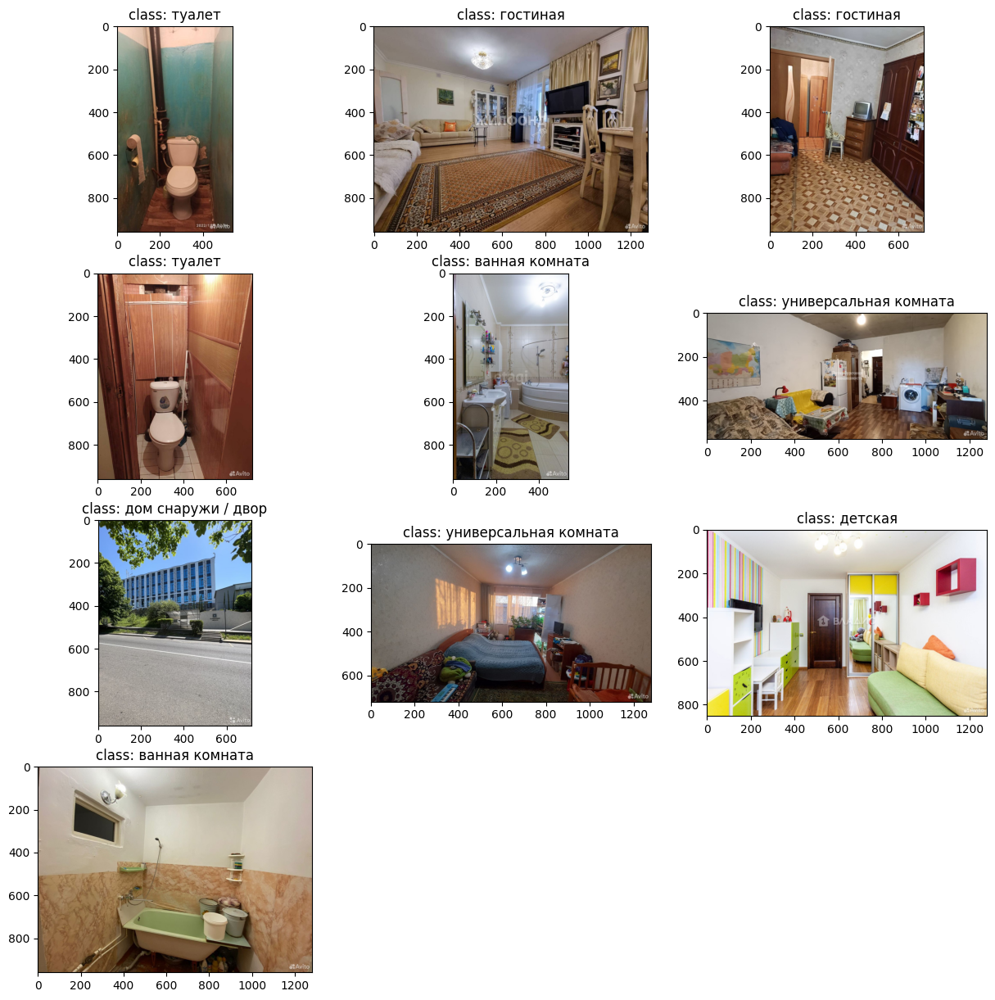

In [76]:
sample_df = train_new.sample(10).reset_index()
plot_imgs_with_labels(sample_df['img_path'][:10], (sample_df['label'][:10], 'class'), )

In [60]:
test_new

,item_id,image,image_id_ext
0,1375153252730,http://labelimages.avito.ru/16028356846.jpg,16028356846
1,1375170002401,http://labelimages.avito.ru/16029739656.jpg,16029739656
2,1342634751186,http://labelimages.avito.ru/15209120394.jpg,15209120394
3,1351692753345,http://labelimages.avito.ru/15233743709.jpg,15233743709
4,1356036751042,http://labelimages.avito.ru/15243147894.jpg,15243147894
...,...,...,...
4557,1362394750305,http://labelimages.avito.ru/15676971547.jpg,15676971547
4558,1362877752318,http://labelimages.avito.ru/15690811434.jpg,15690811434
4559,1367653501740,http://labelimages.avito.ru/15821678048.jpg,15821678048
4560,1367785250583,http://labelimages.avito.ru/15824733534.jpg,15824733534


In [431]:
scores_df_base

,index,precision,recall,f1-score,support
21,weighted avg,0.432739,0.446624,0.423930,4740.0
20,macro avg,0.433713,0.448668,0.425897,4740.0
19,micro avg,0.439394,0.446624,0.442980,4740.0
17,предметы интерьера / быт.техника,0.199501,0.287770,0.235641,278.0
5,кабинет,0.156250,0.036101,0.058651,277.0
11,гардеробная / кладовая / постирочная,0.247191,0.082707,0.123944,266.0
16,другое,0.206557,0.239544,0.221831,263.0
15,подъезд / лестничная площадка,0.408551,0.674510,0.508876,255.0
10,коридор / прихожая,0.498008,0.492126,0.495050,254.0
6,детская,0.394737,0.178571,0.245902,252.0


In [430]:
scores_df_base_toloka

,index,precision,recall,f1-score,support
21,weighted avg,0.484803,0.490931,0.473314,4190.0
20,macro avg,0.455961,0.458241,0.443139,4190.0
19,micro avg,0.481057,0.490931,0.485944,4190.0
15,подъезд / лестничная площадка,0.418491,0.674510,0.516517,255.0
10,коридор / прихожая,0.502008,0.492126,0.497018,254.0
12,балкон / лоджия,0.601852,0.773810,0.677083,252.0
0,кухня / столовая,0.309125,0.658730,0.420786,252.0
2,универсальная комната,0.254658,0.162698,0.198547,252.0
8,туалет,0.658182,0.721116,0.688213,251.0
18,комната без мебели,0.645022,0.593625,0.618257,251.0


In [35]:
plot_sample(test_df, value='детская', column='label', size=9)

KeyError: 'label_pred'

In [ ]:
plot_sample

In [324]:
metrics_scorer = Metrics(class_mapping=CLASS_NAME_MAPPING)
scores_df_base = metrics_scorer.get_accuracies_df(test_targets, test_predictions)

In [300]:
test_df[test_df['label'] == 'детская']['type'].value_counts()

toloka        187
heuristics     65
Name: type, dtype: int64

In [301]:
scores_df_base_toloka

,index,precision,recall,f1-score,support
21,weighted avg,0.494968,0.499045,0.486150,4190.0
20,macro avg,0.468459,0.456225,0.448395,4190.0
19,micro avg,0.486959,0.499045,0.492928,4190.0
15,подъезд / лестничная площадка,0.331597,0.749020,0.459687,255.0
10,коридор / прихожая,0.509934,0.606299,0.553957,254.0
12,балкон / лоджия,0.712598,0.718254,0.715415,252.0
0,кухня / столовая,0.395480,0.555556,0.462046,252.0
2,универсальная комната,0.230769,0.178571,0.201342,252.0
8,туалет,0.724000,0.721116,0.722555,251.0
18,комната без мебели,0.733624,0.669323,0.700000,251.0


In [259]:
scores_df

,index,precision,recall,f1-score,support
21,weighted avg,0.446407,0.451688,0.427156,4740.0
20,macro avg,0.449187,0.453063,0.430036,4740.0
19,micro avg,0.442081,0.451688,0.446833,4740.0
17,предметы интерьера / быт.техника,0.276382,0.395683,0.325444,278.0
5,кабинет,0.000000,0.000000,0.000000,277.0
11,гардеробная / кладовая / постирочная,0.437500,0.026316,0.049645,266.0
16,другое,0.258993,0.273764,0.266174,263.0
15,подъезд / лестничная площадка,0.252646,0.749020,0.377844,255.0
10,коридор / прихожая,0.475309,0.606299,0.532872,254.0
6,детская,0.213333,0.190476,0.201258,252.0


#  Добавляем эвристики

    loss_fn = torch.nn.CrossEntropyLoss(reduction='none')
    loss_batch = loss_fn(logits, labels)
    loss_batch = loss_batch * sample_weights

    loss = loss_batch.mean()

In [247]:
heuristics_df['label'].value_counts()

предметы интерьера / быт.техника        6090
детская                                 1140
гардеробная / кладовая / постирочная     934
кабинет                                  923
другое                                   847
балкон / лоджия                          384
Name: label, dtype: int64

In [362]:
train_df_heur

,image_id_ext,item_id,image,result,label,ratio,is_golden,type,img_path,sample_weight
0,1.602836e+10,1.375153e+12,http://labelimages.avito.ru/16028356846.jpg,9.0,совмещенный санузел,1.000000,0.0,toloka,/data/images_labeled/16028356846.jpg,NaN
1,1.602974e+10,1.375170e+12,http://labelimages.avito.ru/16029739656.jpg,1.0,кухня-гостиная,0.666667,0.0,toloka,/data/images_labeled/16029739656.jpg,NaN
2,1.520912e+10,1.342635e+12,http://labelimages.avito.ru/15209120394.jpg,10.0,коридор / прихожая,1.000000,0.0,toloka,/data/images_labeled/15209120394.jpg,NaN
3,1.523374e+10,1.351693e+12,http://labelimages.avito.ru/15233743709.jpg,19.0,комната без мебели,1.000000,0.0,toloka,/data/images_labeled/15233743709.jpg,NaN
4,1.555044e+10,1.356037e+12,http://labelimages.avito.ru/15243147894.jpg,17.0,предметы интерьера / быт.техника,0.666667,0.0,toloka,/data/images_labeled/15550440820.jpg,NaN
...,...,...,...,...,...,...,...,...,...,...
10078,1.574469e+10,NaN,NaN,11.0,гардеробная / кладовая / постирочная,0.000000,NaN,NaN,/data/images_heuristics/15744686503.jpg,0.25
10079,1.574470e+10,NaN,NaN,11.0,гардеробная / кладовая / постирочная,0.000000,NaN,NaN,/data/images_heuristics/15744699148.jpg,0.25
10080,1.575557e+10,NaN,NaN,11.0,гардеробная / кладовая / постирочная,0.000000,NaN,NaN,/data/images_heuristics/15755573651.jpg,0.25
10081,1.575956e+10,NaN,NaN,11.0,гардеробная / кладовая / постирочная,0.000000,NaN,NaN,/data/images_heuristics/15759563527.jpg,0.25


In [410]:
heuristics_df = pd.read_csv('/data/heuristics_labels.csv')
heuristics_df['ratio'] = 0

heuristics_df[TorchDataset.sample_weight_column] = 0.25
train_df_new[TorchDataset.sample_weight_column] = 1.

train_df[TorchDataset.sample_weight_column] = 1.

train_df_heur = pd.concat([train_df, heuristics_df[heuristics_df['label'].isin([
    'детская', 'кабинет', 'гардеробная / кладовая / постирочная'])
                                             ][columns + [TorchDataset.sample_weight_column]]
                     ])

dataset_train_heur = TorchDataset(image_dir=IMAGES_DIR, df=train_df_heur, transformer=get_preprocessor())
#dataset_test = TorchDataset(image_dir=IMAGES_DIR, df=test_df, transformer=get_preprocessor())
train_dataloader_heur = DataLoader(dataset_train_heur, batch_size=32, shuffle=True)
#test_dataloader = DataLoader(dataset_test, batch_size=32, shuffle=False)

In [421]:
device = 'cuda:1'
room_clf = RoomModel(num_classes=len(ROOM_TYPES))

optimizer = AdamW(room_clf.parameters(), lr=0.002)
room_clf = room_clf.to(device)

trainer = TrainerUtils(device=device, tensorboard_dir='/data/tensorboard', experiment_tag='resnet18_heur3')
trainer.training_loop(
    room_clf,
    train_dataloader_heur,
    test_dataloader,
    optimizer,
    epoch_num=15,
    validate_every=10,
    verbose=True,
)

  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 0: 0.183


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 1: 0.2728


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 2: 0.3243


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 3: 0.3848


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 4: 0.4177


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 5: 0.3694


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 6: 0.4516


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 7: 0.4283


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 8: 0.3838


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 9: 0.4229


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 10: 0.4023


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 11: 0.4448


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 12: 0.4277


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 13: 0.4462


  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 14: 0.4332


In [423]:
room_clf, meta_info = RoomModel.from_pretrained('/app/data/models/model_resnet18_heur3')
test_predictions, test_probas, test_targets, _ = trainer.predict(room_clf, test_dataloader, with_all_probas=False)

test_df['result_pred'] = test_predictions
test_df['label_pred'] = test_df['result_pred'].map(CLASS_NAME_MAPPING)
test_df['proba'] = test_probas

scores_df_heur = metrics_scorer.get_accuracies_df(test_targets, test_predictions)

  0%|          | 0/156 [00:00<?, ?it/s]

In [424]:
room_clf, meta_info = RoomModel.from_pretrained('/app/data/models/model_resnet18_heur3')
test_predictions, test_probas, test_targets, _ = trainer.predict(
    room_clf, test_dataloader_toloka, with_all_probas=False)

test_toloka_df['result_pred'] = test_predictions
test_toloka_df['label_pred'] = test_toloka_df['result_pred'].map(CLASS_NAME_MAPPING)
test_toloka_df['proba'] = test_probas

test_toloka_df['label'] = test_toloka_df['result'].map(CLASS_NAME_MAPPING)

scores_df_heur_toloka = metrics_scorer.get_accuracies_df(test_targets, test_predictions)

  0%|          | 0/139 [00:00<?, ?it/s]

In [435]:
scores_df_heur

,index,precision,recall,f1-score,support
21,weighted avg,0.463710,0.464346,0.446989,4740.0
20,macro avg,0.468474,0.461198,0.444162,4740.0
19,micro avg,0.467701,0.464346,0.466017,4740.0
17,предметы интерьера / быт.техника,0.279661,0.118705,0.166667,278.0
5,кабинет,0.287037,0.223827,0.251521,277.0
11,гардеробная / кладовая / постирочная,0.435185,0.353383,0.390041,266.0
16,другое,0.163399,0.190114,0.175747,263.0
15,подъезд / лестничная площадка,0.396896,0.701961,0.507082,255.0
10,коридор / прихожая,0.517375,0.527559,0.522417,254.0
6,детская,0.282787,0.273810,0.278226,252.0


In [436]:
scores_df_heur_toloka

,index,precision,recall,f1-score,support
21,weighted avg,0.496005,0.487828,0.463253,4190.0
20,macro avg,0.468891,0.465072,0.433890,4190.0
19,micro avg,0.487712,0.487828,0.487770,4190.0
15,подъезд / лестничная площадка,0.412442,0.701961,0.519594,255.0
10,коридор / прихожая,0.521401,0.527559,0.524462,254.0
12,балкон / лоджия,0.746667,0.666667,0.704403,252.0
0,кухня / столовая,0.474820,0.523810,0.498113,252.0
2,универсальная комната,0.294118,0.198413,0.236967,252.0
8,туалет,0.860606,0.565737,0.682692,251.0
18,комната без мебели,0.511873,0.772908,0.615873,251.0


In [438]:
scores_df_base_toloka

,index,precision,recall,f1-score,support
21,weighted avg,0.484803,0.490931,0.473314,4190.0
20,macro avg,0.455961,0.458241,0.443139,4190.0
19,micro avg,0.481057,0.490931,0.485944,4190.0
15,подъезд / лестничная площадка,0.418491,0.674510,0.516517,255.0
10,коридор / прихожая,0.502008,0.492126,0.497018,254.0
12,балкон / лоджия,0.601852,0.773810,0.677083,252.0
0,кухня / столовая,0.309125,0.658730,0.420786,252.0
2,универсальная комната,0.254658,0.162698,0.198547,252.0
8,туалет,0.658182,0.721116,0.688213,251.0
18,комната без мебели,0.645022,0.593625,0.618257,251.0


In [437]:
scores_df_base

,index,precision,recall,f1-score,support
21,weighted avg,0.432739,0.446624,0.423930,4740.0
20,macro avg,0.433713,0.448668,0.425897,4740.0
19,micro avg,0.439394,0.446624,0.442980,4740.0
17,предметы интерьера / быт.техника,0.199501,0.287770,0.235641,278.0
5,кабинет,0.156250,0.036101,0.058651,277.0
11,гардеробная / кладовая / постирочная,0.247191,0.082707,0.123944,266.0
16,другое,0.206557,0.239544,0.221831,263.0
15,подъезд / лестничная площадка,0.408551,0.674510,0.508876,255.0
10,коридор / прихожая,0.498008,0.492126,0.495050,254.0
6,детская,0.394737,0.178571,0.245902,252.0


In [380]:
scores_df_heur

,index,precision,recall,f1-score,support
21,weighted avg,0.426749,0.422785,0.403149,4740.0
20,macro avg,0.428141,0.425917,0.405961,4740.0
19,micro avg,0.416199,0.422785,0.419466,4740.0
17,предметы интерьера / быт.техника,0.289855,0.071942,0.115274,278.0
5,кабинет,0.150602,0.090253,0.112867,277.0
11,гардеробная / кладовая / постирочная,0.296588,0.424812,0.349304,266.0
16,другое,0.125725,0.247148,0.166667,263.0
15,подъезд / лестничная площадка,0.337165,0.690196,0.453024,255.0
10,коридор / прихожая,0.466102,0.433071,0.448980,254.0
6,детская,0.276119,0.146825,0.191710,252.0


In [321]:
scores_df_heur = metrics_scorer.get_accuracies_df(test_targets, test_predictions)

In [238]:
test_df['label'] = test_df['result'].map(CLASS_NAME_MAPPING)

/app/lib/model/utils.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


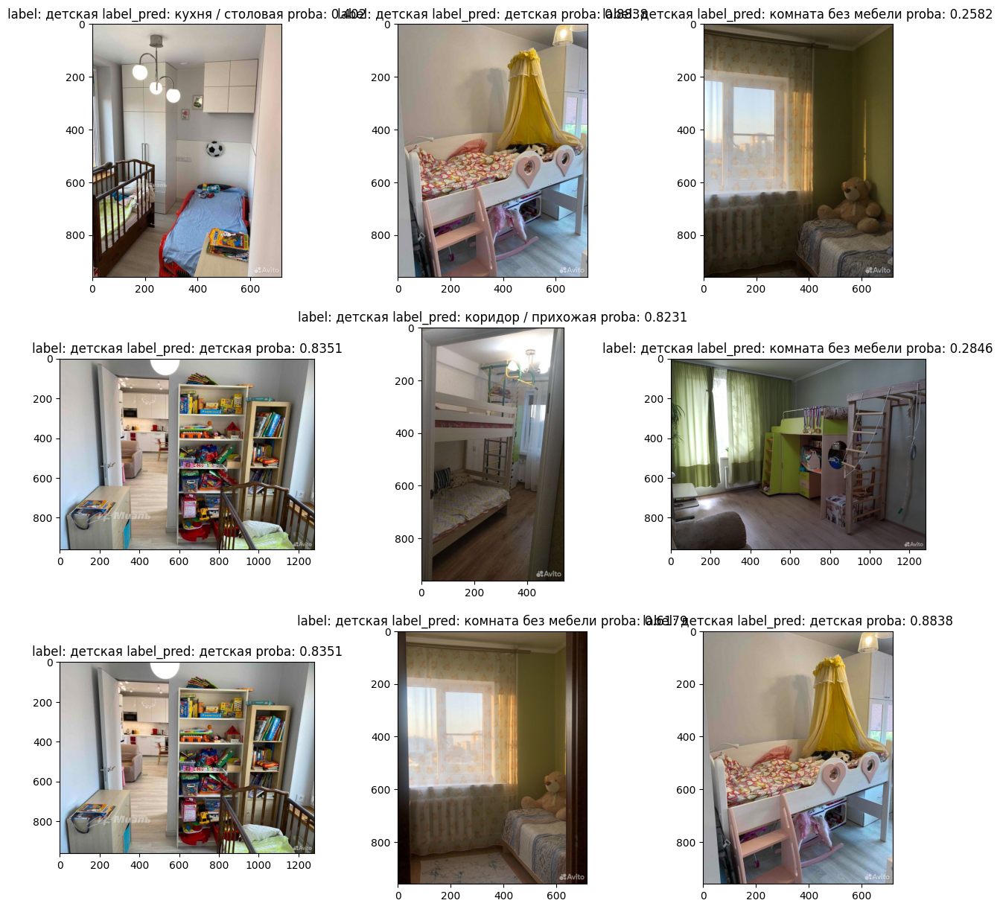

In [159]:
plot_sample(test_df, value='детская', column='label', size=9)

In [305]:
scores_df_heur_toloka

,index,precision,recall,f1-score,support
21,weighted avg,0.498778,0.480430,0.475269,4190.0
20,macro avg,0.465515,0.452740,0.445688,4190.0
19,micro avg,0.465541,0.480430,0.472868,4190.0
15,подъезд / лестничная площадка,0.642424,0.415686,0.504762,255.0
10,коридор / прихожая,0.582278,0.543307,0.562118,254.0
12,балкон / лоджия,0.770833,0.587302,0.666667,252.0
0,кухня / столовая,0.544186,0.464286,0.501071,252.0
2,универсальная комната,0.257143,0.071429,0.111801,252.0
8,туалет,0.866667,0.569721,0.687500,251.0
18,комната без мебели,0.650000,0.621514,0.635438,251.0


In [314]:
metrics_idx = ['macro avg', 'детская', 'кабинет', 'гардеробная / кладовая / постирочная']
metrics_cols = ['index', 'precision', 'recall', 'f1-score']
scores_df_base_toloka[scores_df_base_toloka['index'].isin(metrics_idx)][metrics_cols]

,index,precision,recall,f1-score
20,macro avg,0.468459,0.456225,0.448395
6,детская,0.212264,0.240642,0.225564
5,кабинет,0.000000,0.000000,0.000000
11,гардеробная / кладовая / постирочная,0.466667,0.109375,0.177215


In [328]:
scores_df_heur_toloka[scores_df_heur_toloka['index'].isin(metrics_idx)][metrics_cols + ['support']].merge(
    scores_df_base_toloka[scores_df_base_toloka['index'].isin(metrics_idx)][metrics_cols], on='index', 
    suffixes=['_heur', ''])[
    ['index', 'precision', 'precision_heur', 'recall', 'recall_heur', 'f1-score', 'f1-score_heur', 'support']]

,index,precision,precision_heur,recall,recall_heur,f1-score,f1-score_heur,support
0,macro avg,0.468459,0.465515,0.456225,0.452740,0.448395,0.445688,4190.0
1,детская,0.212264,0.200743,0.240642,0.288770,0.225564,0.236842,187.0
2,кабинет,0.000000,0.096774,0.000000,0.136364,0.000000,0.113208,88.0
3,гардеробная / кладовая / постирочная,0.466667,0.193182,0.109375,0.265625,0.177215,0.223684,64.0


In [329]:
scores_df_heur[scores_df_heur['index'].isin(metrics_idx)][metrics_cols + ['support']].merge(
    scores_df_base[scores_df_base['index'].isin(metrics_idx)][metrics_cols], on='index', 
    suffixes=['_heur', ''])[
    ['index', 'precision', 'precision_heur', 'recall', 'recall_heur', 'f1-score', 'f1-score_heur', 'support']]

,index,precision,precision_heur,recall,recall_heur,f1-score,f1-score_heur,support
0,macro avg,0.449187,0.509685,0.453063,0.496739,0.430036,0.490317,4740.0
1,кабинет,0.000000,0.566343,0.000000,0.631769,0.000000,0.597270,277.0
2,гардеробная / кладовая / постирочная,0.437500,0.686441,0.026316,0.609023,0.049645,0.645418,266.0
3,детская,0.213333,0.251592,0.190476,0.313492,0.201258,0.279152,252.0


In [358]:
scores_df_heur_toloka[scores_df_heur_toloka['index'].isin(metrics_idx)][metrics_cols + ['support']].merge(
    scores_df_base_toloka[scores_df_base_toloka['index'].isin(metrics_idx)][metrics_cols], on='index', 
    suffixes=['_heur', ''])[
    ['index', 'precision', 'precision_heur', 'recall', 'recall_heur', 'f1-score', 'f1-score_heur', 'support']]

,index,precision,precision_heur,recall,recall_heur,f1-score,f1-score_heur,support
0,macro avg,0.462482,0.445652,0.447470,0.414204,0.434995,0.411638,4190.0
1,детская,0.236559,0.193277,0.117647,0.122995,0.157143,0.150327,187.0
2,кабинет,0.164062,0.109677,0.238636,0.193182,0.194444,0.139918,88.0
3,гардеробная / кладовая / постирочная,0.266667,0.176101,0.062500,0.437500,0.101266,0.251121,64.0


In [359]:
scores_df_heur[scores_df_heur['index'].isin(metrics_idx)][metrics_cols + ['support']].merge(
    scores_df_base[scores_df_base['index'].isin(metrics_idx)][metrics_cols], on='index', 
    suffixes=['_heur', ''])[
    ['index', 'precision', 'precision_heur', 'recall', 'recall_heur', 'f1-score', 'f1-score_heur', 'support']]

,index,precision,precision_heur,recall,recall_heur,f1-score,f1-score_heur,support
0,macro avg,0.442849,0.454467,0.444451,0.413496,0.421301,0.416907,4740.0
1,кабинет,0.279221,0.331858,0.155235,0.270758,0.199536,0.298211,277.0
2,гардеробная / кладовая / постирочная,0.400000,0.356098,0.052632,0.274436,0.093023,0.309979,266.0
3,детская,0.234694,0.217054,0.091270,0.111111,0.131429,0.146982,252.0


In [335]:
train_df[train_df['label'] == 'детская'].shape, train_df[train_df['label'] == 'кабинет'].shape

((215, 9), (74, 9))

In [333]:
train_df[train_df['label'] == 'гардеробная / кладовая / постирочная'].shape

(59, 9)

In [327]:
heuristics_df

,image_id,item_id,item_id_ext,microcat_id,microcat_name,crop_coords,crop_area,n_texts,perform_top_microcat_value,perform_top_microcat_prob,...,i2p_attribute,i2p_attribure_value_name,i2p_attribute_value_prob,label,result,img_path,image_id_ext,room_type,ratio,sample_weight
0,15577015881,1358374752453,2646240425,347454000001,Спальные гарнитуры,"[0.0724826380610466, 0.014007568359375, 0.8645...",0.764374,0,236.0,0.760088,...,126436,odnospalnaya,0.751965,детская,6,/data/images_heuristics/15577015881.jpg,15577015881,детская,0,0.25
1,15579444552,1358450002545,2658123479,347454000001,Спальные гарнитуры,"[0.201171875, 0.0284423828125, 0.9361978769302...",0.696893,0,274.0,0.464302,...,126436,odnospalnaya,0.856290,детская,6,/data/images_heuristics/15579444552.jpg,15579444552,детская,0,0.25
2,15596475428,1358997001232,2622819104,347454000001,Спальные гарнитуры,"[0.068603515625, 0.02278645895421505, 0.955078...",0.839150,1,236.0,0.364108,...,126436,odnospalnaya,0.692722,детская,6,/data/images_heuristics/15596475428.jpg,15596475428,детская,0,0.25
3,15608560245,1359511251370,2621083801,347454000001,Спальные гарнитуры,"[0.060516357421875, 0.142578125, 0.93603515625...",0.712499,2,235.0,0.323518,...,126436,odnospalnaya,0.811393,детская,6,/data/images_heuristics/15608560245.jpg,15608560245,детская,0,0.25
4,15619348543,1359914252957,2615707656,347454000001,Спальные гарнитуры,"[0.0558268204331398, 0.061370849609375, 0.9016...",0.618834,1,243.0,0.611608,...,126436,odnospalnaya,0.635305,детская,6,/data/images_heuristics/15619348543.jpg,15619348543,детская,0,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10313,15825131386,1368005251583,2653540328,760,Окна и балконы,"[0.1383056640625, 0.022605428472161293, 0.9404...",0.761403,1,232.0,0.444847,...,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15825131386.jpg,15825131386,балкон / лоджия,0,0.25
10314,15825133054,1368003251483,2652878736,760,Окна и балконы,"[0.08087158203125, 0.032371245324611664, 0.945...",0.661420,1,232.0,0.695469,...,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15825133054.jpg,15825133054,балкон / лоджия,0,0.25
10315,15828221044,1368182500279,2650565944,760,Окна и балконы,"[0.1179199144244194, 0.02915736474096775, 0.90...",0.748146,1,232.0,0.909764,...,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15828221044.jpg,15828221044,балкон / лоджия,0,0.25
10316,15828830255,1368003500643,2632388369,760,Окна и балконы,"[0.10687255859375, 0.035302337259054184, 0.858...",0.697966,0,232.0,0.963911,...,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15828830255.jpg,15828830255,балкон / лоджия,0,0.25


In [255]:
scores_df_heur

,index,precision,recall,f1-score,support
21,weighted avg,0.510727,0.499789,0.492360,4740.0
20,macro avg,0.509685,0.496739,0.490317,4740.0
19,micro avg,0.486248,0.499789,0.492926,4740.0
17,предметы интерьера / быт.техника,0.251101,0.410072,0.311475,278.0
5,кабинет,0.566343,0.631769,0.597270,277.0
11,гардеробная / кладовая / постирочная,0.686441,0.609023,0.645418,266.0
16,другое,0.337349,0.212928,0.261072,263.0
15,подъезд / лестничная площадка,0.609195,0.415686,0.494172,255.0
10,коридор / прихожая,0.579832,0.543307,0.560976,254.0
6,детская,0.251592,0.313492,0.279152,252.0


In [253]:
scores_df_heur

,index,precision,recall,f1-score,support
21,weighted avg,0.461292,0.416878,0.392008,4740.0
20,macro avg,0.459791,0.421051,0.395389,4740.0
19,micro avg,0.414169,0.416878,0.415519,4740.0
17,предметы интерьера / быт.техника,0.280423,0.190647,0.226981,278.0
5,кабинет,0.454545,0.054152,0.096774,277.0
11,гардеробная / кладовая / постирочная,0.611111,0.041353,0.077465,266.0
16,другое,0.270833,0.098859,0.144847,263.0
15,подъезд / лестничная площадка,0.321773,0.654902,0.431525,255.0
10,коридор / прихожая,0.274457,0.795276,0.408081,254.0
6,детская,0.212560,0.349206,0.264264,252.0


# Рандомный семпл: смотрим на предсказания perform'а
 - Проскорим случайный семпл из недвиги

In [79]:
random_df = pd.read_csv('/data/random_images_big.csv')
random_df['img_path'] = random_df['image_path']

/usr/local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3012: DtypeWarning: Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [78]:
random_df.to_csv('/data/random_images_big.csv', index=False)

In [95]:
random_df['perform_class'].value_counts()

Ванная                  68712
Дом снаружи             55265
Кухня                   50749
Комната                 49413
Бетон                   22438
Скриншоты переписок     14042
Дети                     6183
Порнография              1869
Человек                  1395
Алкоголь                  679
Автомобильные номера      464
Печать                    100
Банковские карты           49
Сигареты                   24
Медикаменты                22
Вооруженный                22
Огнестрельное оружие       14
Свастика                   12
Name: perform_class, dtype: int64

In [182]:
CLASS_NAME_MAPPING

{0: 'кухня / столовая',
 1: 'кухня-гостиная',
 2: 'универсальная комната',
 3: 'гостиная',
 4: 'спальня',
 5: 'кабинет',
 6: 'детская',
 7: 'ванная комната',
 8: 'туалет',
 9: 'совмещенный санузел',
 10: 'коридор / прихожая',
 11: 'гардеробная / кладовая / постирочная',
 12: 'балкон / лоджия',
 13: 'вид из окна / с балкона',
 14: 'дом снаружи / двор',
 15: 'подъезд / лестничная площадка',
 16: 'другое',
 17: 'предметы интерьера / быт.техника',
 19: 'комната без мебели'}

In [181]:
train_df

,img_path,result,image_id_ext,sample_weight
0,/data/images/12754069006.jpg,4.0,12754069006,1.0
1,/data/images/14253769171.jpg,7.0,14253769171,1.0
2,/data/images/14256370839.jpg,10.0,14256370839,1.0
3,/data/images/14256970354.jpg,19.0,14256970354,1.0
4,/data/images/14257234206.jpg,0.0,14257234206,1.0
...,...,...,...,...
7645,/data/images/14493624429.jpg,3.0,14493624429,1.0
7646,/data/images/14493726548.jpg,13.0,14493726548,1.0
7647,/data/images/14493801587.jpg,16.0,14493801587,1.0
7648,/data/images/14493804314.jpg,14.0,14493804314,1.0


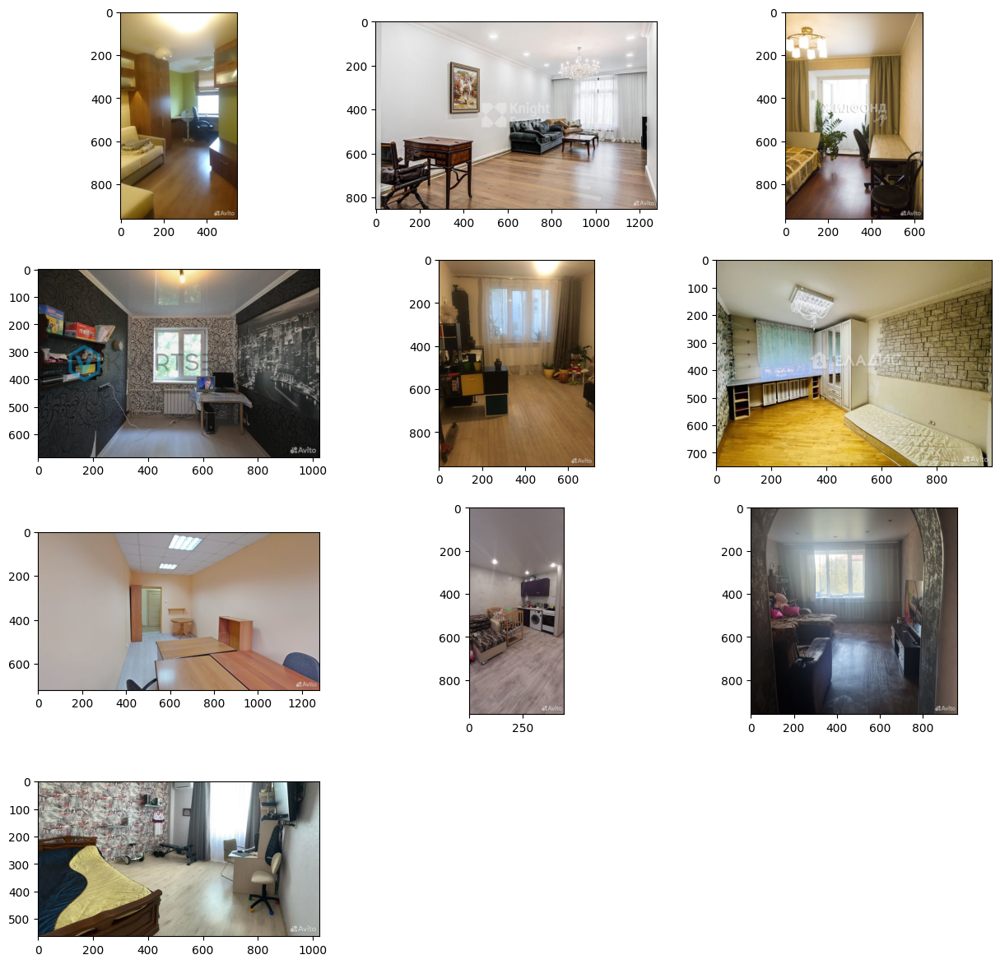

In [186]:
sample_df = train_df[train_df['result'] == 2].sample(10).reset_index()

plot_imgs_with_labels(sample_df['img_path'])#, (sample_df['perform_class'], 'perform_class'))

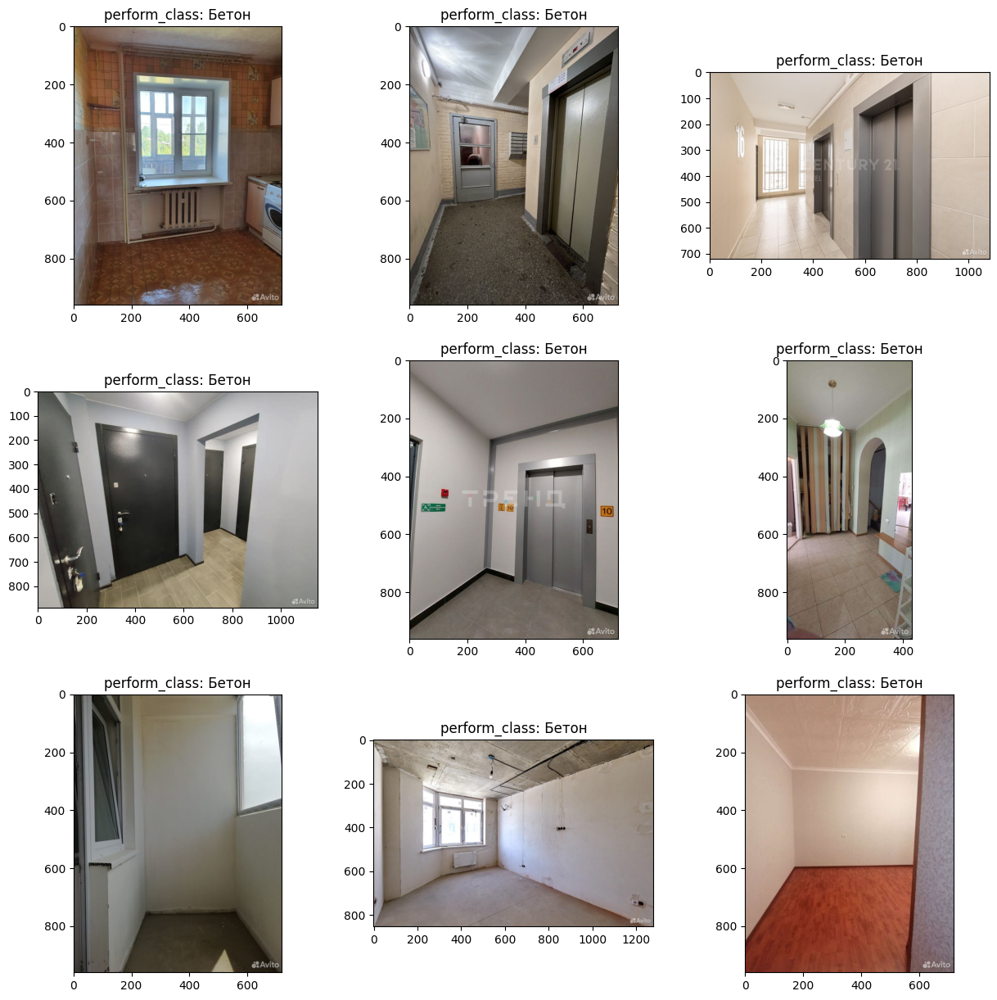

In [171]:
sample_df = random_df[(random_df['perform_class'] == 'Бетон') & (random_df['perform_prob'] >0.65 )
                     ].sample(9).reset_index()

plot_imgs_with_labels(sample_df['image_path'], (sample_df['perform_class'], 'perform_class'))

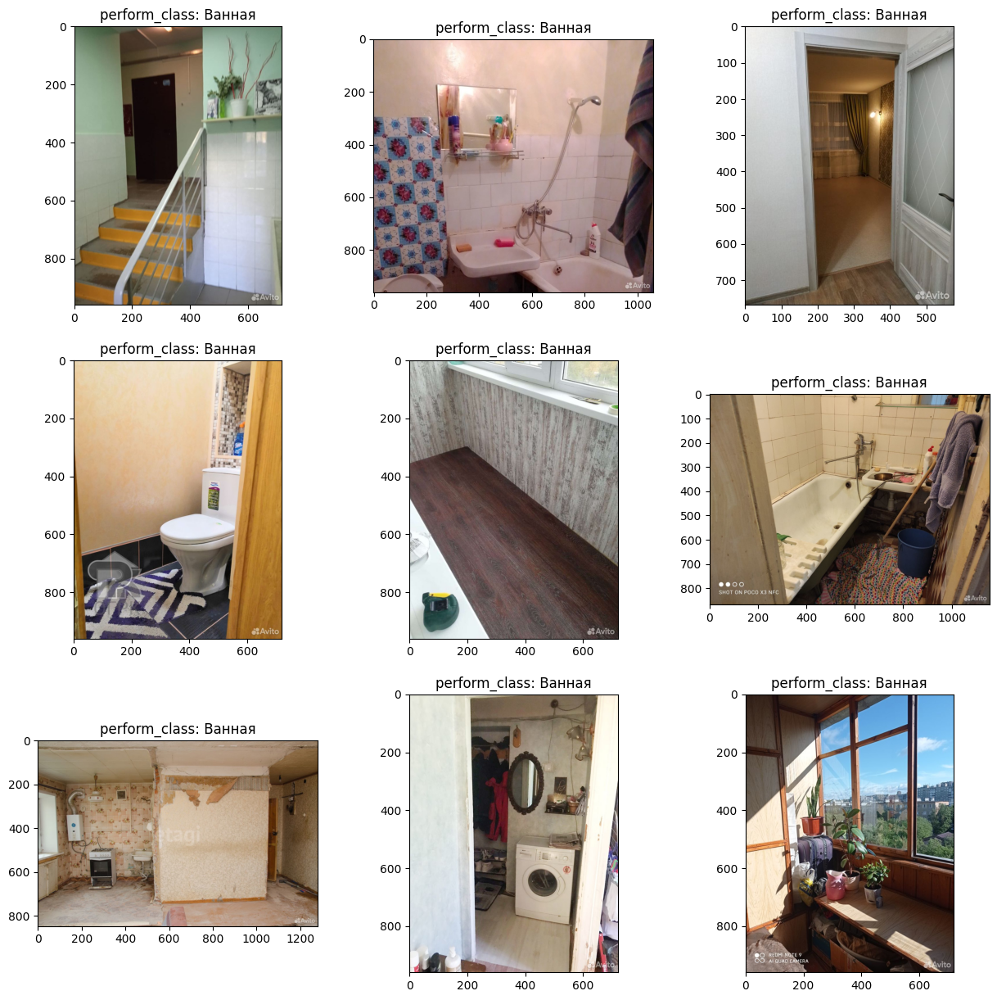

In [93]:
sample_df = random_df[random_df['perform_class'] == 'Ванная'].sample(9).reset_index()

plot_imgs_with_labels(sample_df['image_path'], (sample_df['perform_class'], 'perform_class'))

# Активное обучение

In [115]:
detskaya_id = 6
kuhnia_gost_id = 1
garderob_id = 11
kabinet_id = 5
univers_id = 2

balkon_id = 12
predmety_id = 17

In [105]:
from lib.model.utils import margin_with_diversity, max_min_with_diversity

In [101]:
random_df_small = random_df.sample(50000).reset_index()
random_df_small.to_csv('/data/random_images_small.csv', index=False)

In [116]:
studia_flag = random_df_small['rooms_number'] == 'Студия'
komnat_1_flag = random_df_small['rooms_number'] == 1
komnat_2_flag = random_df_small['rooms_number'] == 2
komnat_3_flag = random_df_small['rooms_number'] == 3

In [103]:
predictions_all, probas_all, targets_all, all_class_probas = predict_img_batch(
    image_paths=random_df_small['image_path'], with_all_probas=True, 
    model_path='/app/data/models/model_resnet18_detskaya'
)
probas = np.array(all_class_probas)

random_df_small['prediction'] = predictions_all
random_df_small['pred_class'] = random_df_small['prediction'].map(CLASS_NAME_MAPPING)
random_df_small['proba'] = probas_all

  0%|          | 0/1563 [00:00<?, ?it/s]

In [122]:
random_df_small['pred_class'].value_counts()

дом снаружи / двор                      8259
коридор / прихожая                      7051
комната без мебели                      5897
кухня / столовая                        5554
гостиная                                5175
ванная комната                          3244
вид из окна / с балкона                 2443
балкон / лоджия                         2394
спальня                                 2220
подъезд / лестничная площадка           2110
туалет                                  1931
детская                                 1116
предметы интерьера / быт.техника         867
совмещенный санузел                      815
другое                                   590
универсальная комната                    224
кухня-гостиная                           101
кабинет                                    5
гардеробная / кладовая / постирочная       4
Name: pred_class, dtype: int64

In [178]:
indx_gost_0 = np.argwhere((probas[:,kabinet_id] > 0.1) & (np.array(studia_flag)))[:,0]

In [179]:
indx_gost_0

array([ 7187, 23778, 29287, 33648, 34222, 35674, 36539, 40370, 43721,
       44326, 49449])

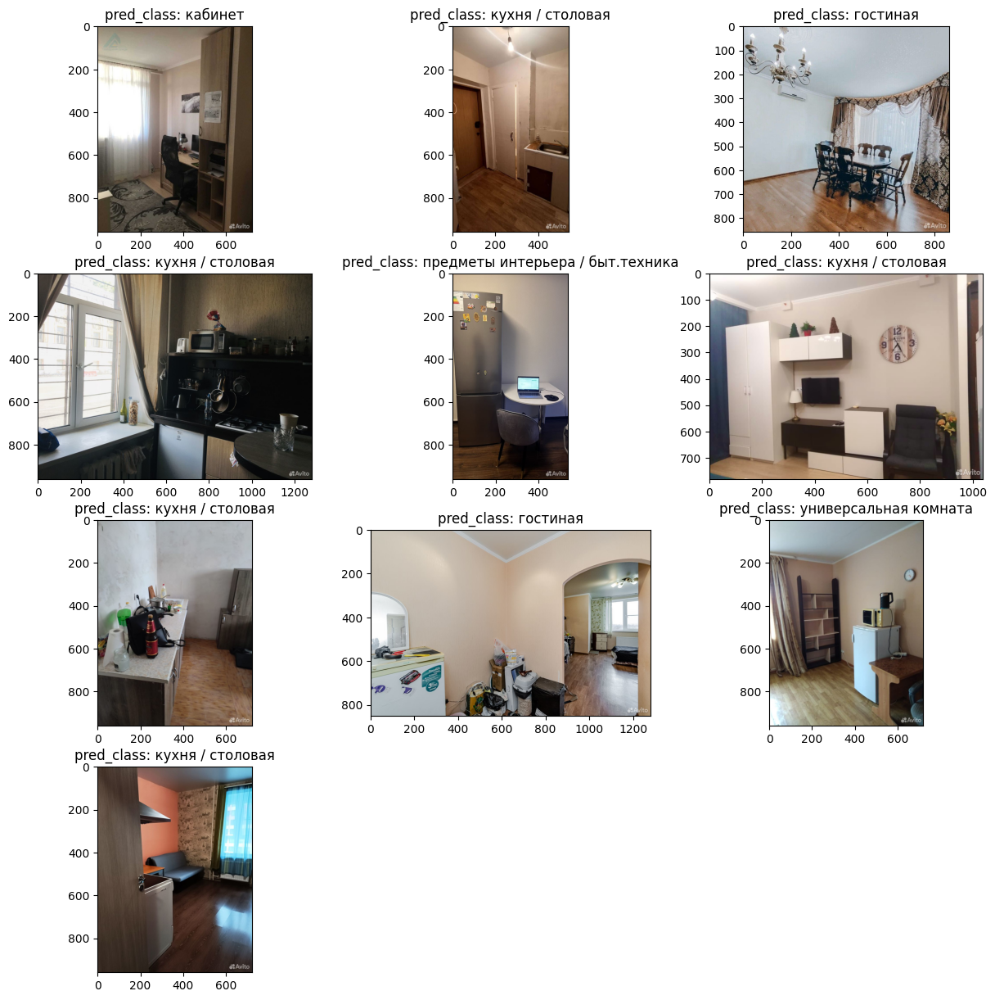

In [180]:
sample_df = random_df_small[random_df_small['prediction'].isin([garderob_id])]
sample_df = random_df_small.iloc[indx_gost_0].sample(10).reset_index()
                            
plot_imgs_with_labels(sample_df['image_path'], (sample_df['pred_class'], 'pred_class'))

/app/lib/model/utils.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


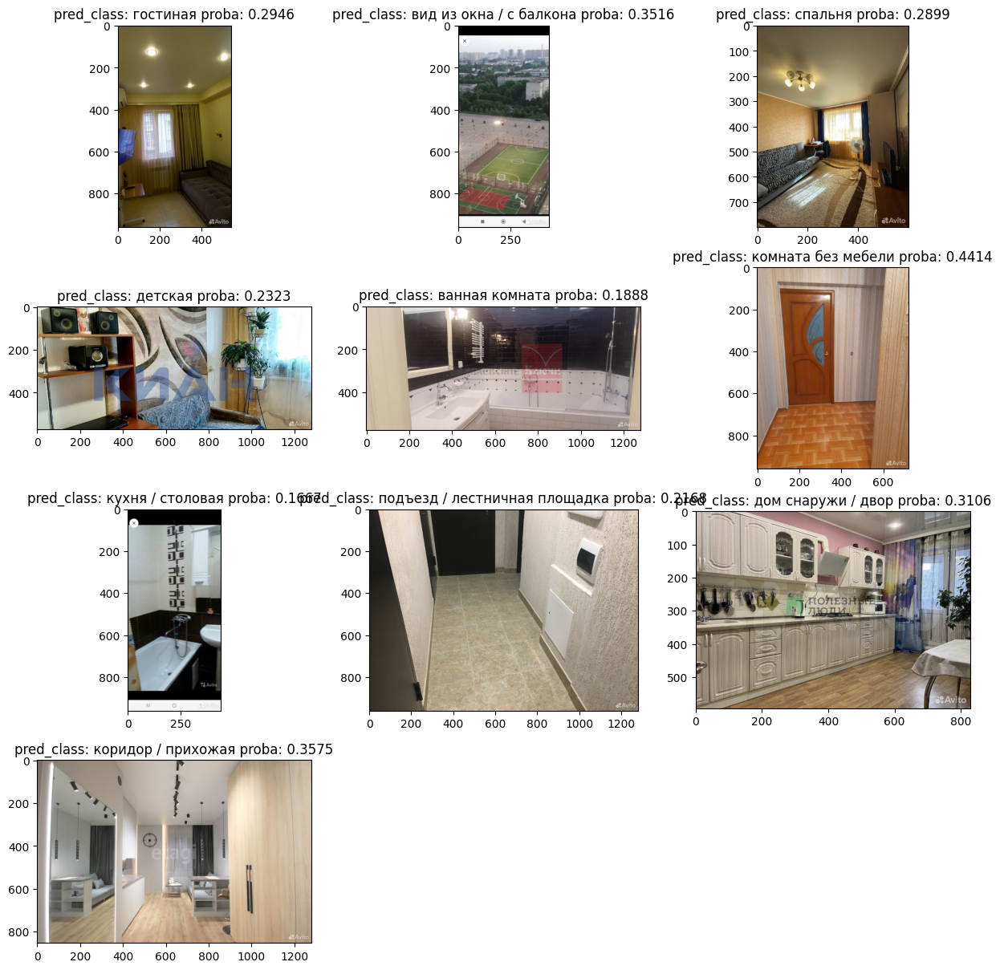

In [138]:
margin_indxs, counts = margin_with_diversity(probas, sample_size=10)
sample_df = random_df_small.iloc[margin_indxs].sample(10).reset_index()
                            
plot_imgs_with_labels(sample_df['image_path'], (sample_df['pred_class'], 'pred_class'), 
                      (sample_df['proba'], 'proba'))

/app/lib/model/utils.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


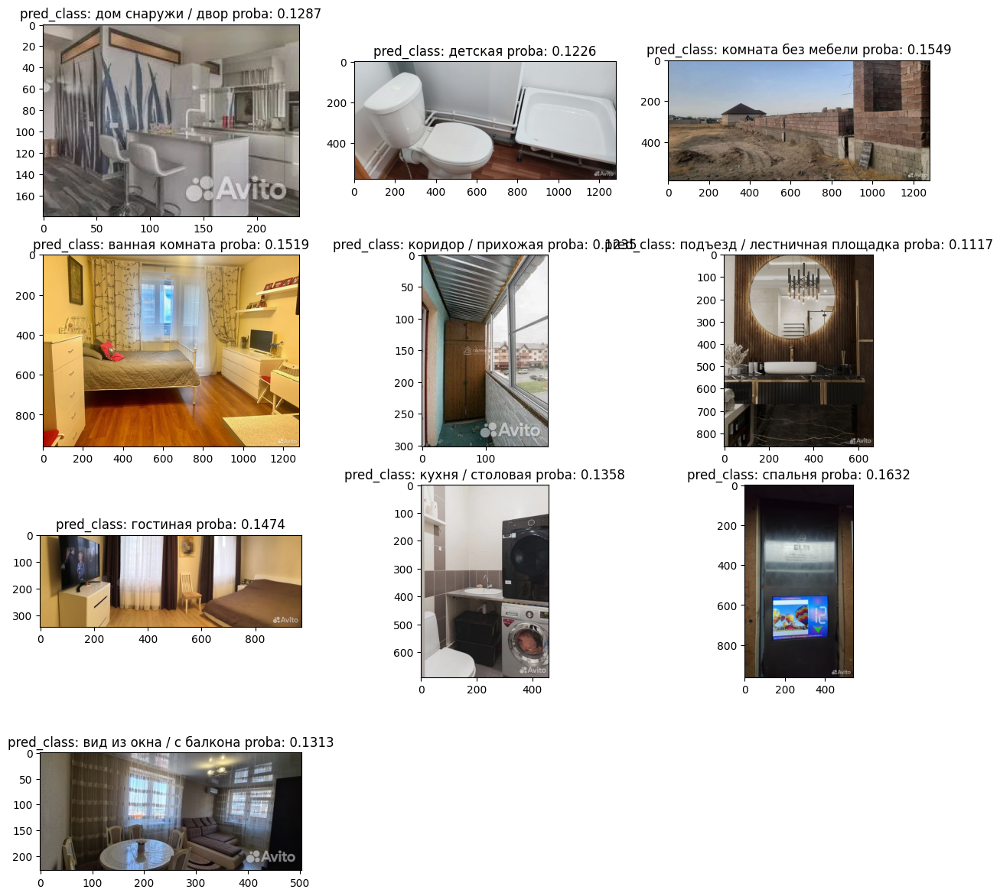

In [139]:
margin_indxs, counts = max_min_with_diversity(probas, sample_size=10)
sample_df = random_df_small.iloc[margin_indxs].sample(10).reset_index()
                            
plot_imgs_with_labels(sample_df['image_path'], (sample_df['pred_class'], 'pred_class'), 
                      (sample_df['proba'], 'proba'))

# Домашнее задание

### Есть несколько семплов с метаинформацией и картинками:
- 5к трейн из недвиги размеченный в семинаре с толокой

- 2 семпла из general для эвристик по классам:
  - 20к гардеробные
  - 20к кабинеты
  
- 50к неразмеченный рандом из недвиги

### Задача

Получить максимальный скор на рандоме(будет расчитан на известных только нам 5 тыс).

Метрика: усредненный по классам f1-score

### Какие есть инструменты для этого

- эвристики по двум классам (general)
- эвристики по рандому:
  - активное обучение
  - перформ
- доп бюджет на толоку (5 долларов?)
- ваша фантазия)


In [192]:
pd.read_csv('/app/data/AAA_dataset_course_ha_heuristics_detskaya.csv')

,image_id,item_id,item_id_ext,microcat_id,microcat_name,crop_coords,crop_area,n_texts,perform_top_microcat_value,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob,i2p_attribute,i2p_attribure_value_name,i2p_attribute_value_prob,title,description,perform_top_microcat_name,image_link,img_path_local
0,15986849237,689580510323,2669964578,347454000001,Спальные гарнитуры,"[0.2204589694738388, 0.1370442658662796, 0.957...",0.575589,3,237,0.246469,Скриншоты переписок,0.031009,126436,drugaya,0.565664,Спальня Мартина,Спальня Мартина\n \nВажное отличие - мебель вс...,"Кровати, диваны и кресла",http://labelimages.avito.ru/15986849237.jpg,/data/images_detskaya/15986849237.jpg
1,15979254876,689580760168,2660519156,347454000001,Спальные гарнитуры,"[0.191650390625, 0.2275390625, 0.951171875, 0....",0.543186,1,237,0.765472,Комната,0.845141,126436,dvuspalnaya,0.623067,Спальная мебель бу,Спальная мебель б/у,"Кровати, диваны и кресла",http://labelimages.avito.ru/15979254876.jpg,/data/images_detskaya/15979254876.jpg
2,16001041449,689582760832,2708558104,347454000001,Спальные гарнитуры,"[0.066162109375, 0.07451396435499191, 0.794433...",0.614579,0,237,0.836585,Скриншоты переписок,0.010549,126436,dvuspalnaya,0.723083,Спальный гарнитур с матрасом Саманта,Спальный гарнитур с матрасом Саманта\n \nБЕСПЛ...,"Кровати, диваны и кресла",http://labelimages.avito.ru/16001041449.jpg,/data/images_detskaya/16001041449.jpg
3,15941608501,689584260109,2654877091,347447750001,Кровати,"[0.06585693359375, 0.15848475694656372, 0.9379...",0.659147,2,237,0.907106,Алкоголь,0.010479,126436,odnospalnaya,0.746445,Кровать Фиеста NEW 0.9 м венге / лоредо,Кровать с мягким изголовьем новая в наличии. В...,"Кровати, диваны и кресла",http://labelimages.avito.ru/15941608501.jpg,/data/images_detskaya/15941608501.jpg
4,15955640067,689629005899,2700693976,347454000001,Спальные гарнитуры,"[0.0185546875, 0.08669354766607285, 0.97412109...",0.789081,1,237,0.506734,Планировка квартиры,0.018787,126436,dvuspalnaya,0.988460,Спальный гарнитур Ампир с матрасом в комплекте,Спальный гарнитур Ампир с матрасом в комплекте...,"Кровати, диваны и кресла",http://labelimages.avito.ru/15955640067.jpg,/data/images_detskaya/15955640067.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,15798071108,1366934002665,2653172417,347447750001,Кровати,"[0.217041015625, 0.10143089294433594, 0.821777...",0.466673,1,275,0.565875,Скриншоты переписок,0.005426,126436,odnospalnaya,0.622714,Детская кровать,Это Фабрика хорошего настроения!🙂 Мы находимся...,Игрушки,http://labelimages.avito.ru/15798071108.jpg,/data/images_detskaya/15798071108.jpg
20636,15787764054,1366547005928,2672234421,5003,Другое,"[0.1650390625, 0.1588541716337204, 0.7578125, ...",0.461561,0,275,0.161858,Порнография,0.015246,126436,odnospalnaya,0.517190,Кубики для детской комнаты в скандистиле,Интерьерные кубики с именем вашего малыша для ...,Игрушки,http://labelimages.avito.ru/15787764054.jpg,/data/images_detskaya/15787764054.jpg
20637,16051509906,1375790758168,2706119542,347447750001,Кровати,"[0.0222981758415699, 0.2158203125, 0.966796875...",0.610142,1,5536,0.242166,Планировка,0.392039,126436,dvuspalnaya,0.524203,Изголовье для кровати,Изголовье под заказ. Любого цвета и размера. П...,Салон,http://labelimages.avito.ru/16051509906.jpg,/data/images_detskaya/16051509906.jpg
20638,16053061703,1375861500805,2682390219,347447750001,Кровати,"[0.1490478515625, 0.3522135317325592, 0.863769...",0.344332,1,539,0.236940,Дети,0.034452,126436,odnospalnaya,0.988277,Кровать односпальная,Односпальная кровать с двумя выдвижными ящиками,Меконгский бобтейл,http://labelimages.avito.ru/16053061703.jpg,/data/images_detskaya/16053061703.jpg


CPU times: user 329 µs, sys: 9 µs, total: 338 µs
Wall time: 305 µs


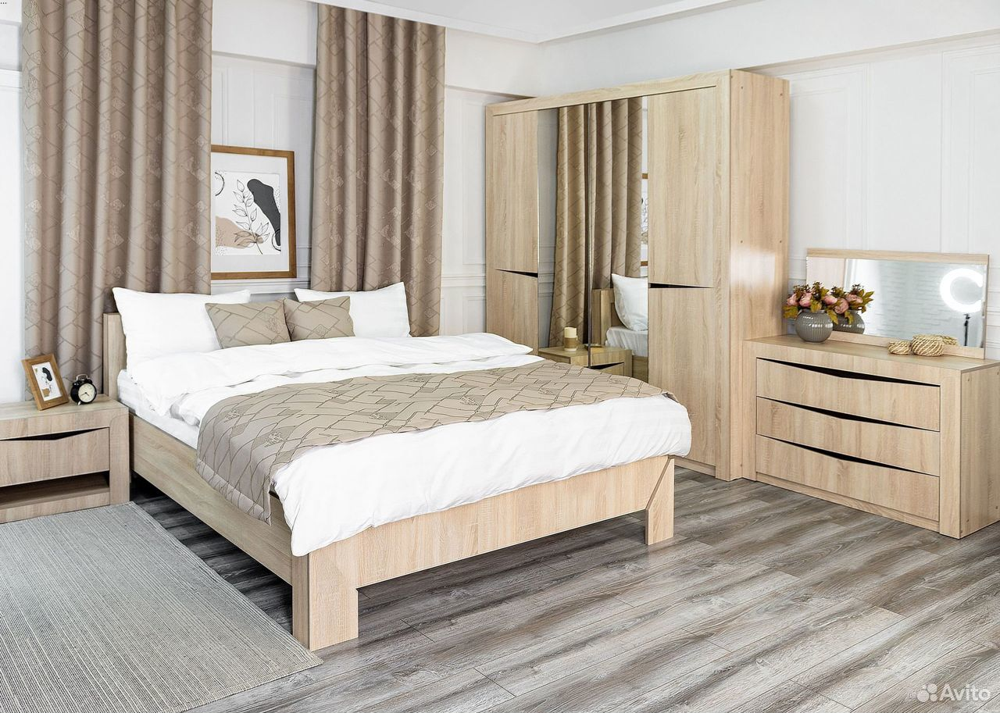

In [202]:
%%time
img = Image.open("/data/images_detskaya/16001041449.jpg")
img

In [193]:
import urllib.request
from PIL import Image
  
urllib.request.urlretrieve(
  'http://labelimages.avito.ru/15986849237.jpg',
   "15986849237.jpg"
)

('15986849237.jpg', <http.client.HTTPMessage at 0x7f035736cb50>)

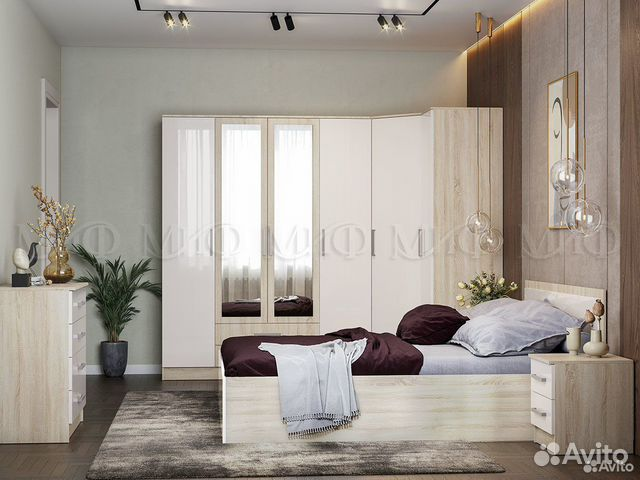

In [194]:
img = Image.open("15986849237.jpg")
img

In [92]:
scores_df_heur

,index,precision,recall,f1-score,support
21,weighted avg,0.743818,0.678146,0.692604,755.000000
20,macro avg,0.536434,0.500209,0.496150,755.000000
14,дом снаружи / двор,0.962687,0.908451,0.934783,142.000000
0,кухня / столовая,0.731707,0.689655,0.710059,87.000000
7,ванная комната,0.655738,0.597015,0.625000,67.000000
4,спальня,0.882353,0.454545,0.600000,66.000000
10,коридор / прихожая,0.655914,0.938462,0.772152,65.000000
3,гостиная,0.694444,0.471698,0.561798,53.000000
13,вид из окна / с балкона,0.807018,0.884615,0.844037,52.000000
15,подъезд / лестничная площадка,0.863636,0.452381,0.593750,42.000000


In [142]:
test_df['label'] = test_df['result'].map(CLASS_NAME_MAPPING)

test_df['result_pred'] = test_predictions
test_df['label_pred'] = test_df['result_pred'].map(CLASS_NAME_MAPPING)

In [143]:
CLASS_NAME_MAPPING

{0: 'кухня / столовая',
 1: 'кухня-гостиная',
 2: 'универсальная комната',
 3: 'гостиная',
 4: 'спальня',
 5: 'кабинет',
 6: 'детская',
 7: 'ванная комната',
 8: 'туалет',
 9: 'совмещенный санузел',
 10: 'коридор / прихожая',
 11: 'гардеробная / кладовая / постирочная',
 12: 'балкон / лоджия',
 13: 'вид из окна / с балкона',
 14: 'дом снаружи / двор',
 15: 'подъезд / лестничная площадка',
 16: 'другое',
 17: 'предметы интерьера / быт.техника',
 19: 'комната без мебели'}

In [154]:
def plot_sample(test_df, class_name='детская'):
    plot_df = test_df[test_df['label_pred'] == class_name]
    sample_size = min(plot_df.shape[0], 10)

    sample_df = plot_df.sample(sample_size).reset_index()


    plot_imgs_with_labels(sample_df['img_path'], 
                          (sample_df['label'], 'label'), 
                          (sample_df['label_pred'], 'label_pred'), 
                         (sample_df['proba'], 'proba'))
    

In [171]:
import pandas as pd

In [7]:
random_df = pd.read_csv('/data/random_images_big.csv')

/usr/local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3012: DtypeWarning: Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [10]:
random_df[TorchDataset.img_path_column] = random_df['external_image_id'].map(
    lambda x: f'/data/images_random_big/{x}.jpg'
)

In [11]:
os.path.exists(random_df['img_path'][10])

False

In [12]:
detskaya_heur = pd.read_csv('/app/data/AAA_dataset_course_ha_heuristics_detskaya.csv')

ParserError: Error tokenizing data. C error: EOF inside string starting at row 14694

In [ ]:
predict_img_batch(image_paths=)

In [40]:
a, b = scores_df['precision'][2:-1].mean(), scores_df['recall'][2:-1].mean()

In [43]:
a, b

(0.46593648290390444, 0.4513304406845949)

In [44]:
2 * a*b/(a+b)

0.45851717259651115

In [53]:
heuristics_df = pd.read_csv('/data/heuristics_labels.csv')
heuristics_df['label'].value_counts()

предметы интерьера / быт.техника        6090
детская                                 1140
гардеробная / кладовая / постирочная     934
кабинет                                  923
другое                                   847
балкон / лоджия                          384
Name: label, dtype: int64

In [ ]:
ls = pd.read_csv('')

In [57]:
listdir = os.listdir('/data/images_heuristics/')

In [59]:
listdir[:10]

['15455768574.jpg',
 '15790668530.jpg',
 '15825597685.jpg',
 '15826319388.jpg',
 '15823737120.jpg',
 '15790101383.jpg',
 '15825497230.jpg',
 '15795124458.jpg',
 '15810204145.jpg',
 '15823525468.jpg']

In [61]:
for img_id in heuristics_df['image_id']:
    if os.path.exists(f'/data/images_heuristics/{15577015881}.jpg') is False:
        print(img_id)

In [65]:
heuristics_df['img_path'] = heuristics_df['image_id'].map(lambda img_id: f'/data/images_heuristics/{img_id}.jpg')

In [69]:
heuristics_df

,image_id,item_id,item_id_ext,microcat_id,microcat_name,crop_coords,crop_area,n_texts,perform_top_microcat_value,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob,title_re_match,description_re_match,i2p_attribute,i2p_attribure_value_name,i2p_attribute_value_prob,label,result,img_path
0,15577015881,1358374752453,2646240425,347454000001,Спальные гарнитуры,"[0.0724826380610466, 0.014007568359375, 0.8645...",0.764374,0,236.0,0.760088,Скриншоты переписок,0.005731,1.0,1.0,126436,odnospalnaya,0.751965,детская,6,/data/images_heuristics/15577015881.jpg
1,15579444552,1358450002545,2658123479,347454000001,Спальные гарнитуры,"[0.201171875, 0.0284423828125, 0.9361978769302...",0.696893,0,274.0,0.464302,Дети,0.003185,0.0,1.0,126436,odnospalnaya,0.856290,детская,6,/data/images_heuristics/15579444552.jpg
2,15596475428,1358997001232,2622819104,347454000001,Спальные гарнитуры,"[0.068603515625, 0.02278645895421505, 0.955078...",0.839150,1,236.0,0.364108,Кухня,0.099251,1.0,1.0,126436,odnospalnaya,0.692722,детская,6,/data/images_heuristics/15596475428.jpg
3,15608560245,1359511251370,2621083801,347454000001,Спальные гарнитуры,"[0.060516357421875, 0.142578125, 0.93603515625...",0.712499,2,235.0,0.323518,Комната,0.109779,1.0,1.0,126436,odnospalnaya,0.811393,детская,6,/data/images_heuristics/15608560245.jpg
4,15619348543,1359914252957,2615707656,347454000001,Спальные гарнитуры,"[0.0558268204331398, 0.061370849609375, 0.9016...",0.618834,1,243.0,0.611608,Планировка квартиры,0.040389,1.0,1.0,126436,odnospalnaya,0.635305,детская,6,/data/images_heuristics/15619348543.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10313,15825131386,1368005251583,2653540328,760,Окна и балконы,"[0.1383056640625, 0.022605428472161293, 0.9404...",0.761403,1,232.0,0.444847,Бетон,0.478633,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15825131386.jpg
10314,15825133054,1368003251483,2652878736,760,Окна и балконы,"[0.08087158203125, 0.032371245324611664, 0.945...",0.661420,1,232.0,0.695469,Кухня,0.243434,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15825133054.jpg
10315,15828221044,1368182500279,2650565944,760,Окна и балконы,"[0.1179199144244194, 0.02915736474096775, 0.90...",0.748146,1,232.0,0.909764,Бетон,0.151625,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15828221044.jpg
10316,15828830255,1368003500643,2632388369,760,Окна и балконы,"[0.10687255859375, 0.035302337259054184, 0.858...",0.697966,0,232.0,0.963911,Бетон,0.096761,1.0,1.0,-1,NaN,0.000000,балкон / лоджия,12,/data/images_heuristics/15828830255.jpg


In [62]:
train_df

,img_path,result,image_id_ext,room_type
0,/data/images/12754069006.jpg,4.0,12754069006,спальня
1,/data/images/14253769171.jpg,7.0,14253769171,ванная комната
2,/data/images/14256370839.jpg,10.0,14256370839,коридор / прихожая
3,/data/images/14256970354.jpg,19.0,14256970354,комната без мебели
4,/data/images/14257234206.jpg,0.0,14257234206,кухня / столовая
...,...,...,...,...
7645,/data/images/14493624429.jpg,3.0,14493624429,гостиная
7646,/data/images/14493726548.jpg,13.0,14493726548,вид из окна / с балкона
7647,/data/images/14493801587.jpg,16.0,14493801587,другое
7648,/data/images/14493804314.jpg,14.0,14493804314,дом снаружи / двор


In [67]:
test_df

,img_path,result,image_id_ext
0,/data/images/14254945171.jpg,3.0,14254945171
1,/data/images/14297836284.jpg,3.0,14297836284
2,/data/images/14320894256.jpg,10.0,14320894256
3,/data/images/14350377320.jpg,14.0,14350377320
4,/data/images/14354668495.jpg,7.0,14354668495
...,...,...,...
750,/data/images/14484868149.jpg,0.0,14484868149
751,/data/images/14489194744.jpg,0.0,14489194744
752,/data/images/14489323742.jpg,9.0,14489323742
753,/data/images/14489358862.jpg,10.0,14489358862
